# General training and interpretability pipeline

In this notebook, we analyze the immune dataset of 9 batches from four human peripheral blood and bone marrow studies, with 16 annotated cell types. We apply DRVI with 128 latent dimensions to showcase the following:

- How to train DRVI
- Observe vanished dimensions
- Observe the latent space in UMAP and heatmap
- How to run the interpretability pipeline
- How to identify and check individual dimensions

## Contact

For questions and help requests, you can reach out in the [scverse discourse](https://discourse.scverse.org/).

If you found a bug, please use the [issue tracker](https://github.com/theislab/drvi/issues).

## Install

If you try DRVI on colab, next cell will install dependencies.

Please remove this part if your environment is already setup.

In [1]:
import sys

# if branch is stable, will install via pypi, else will install from source
branch = "latest"
IN_COLAB = "google.colab" in sys.modules

if IN_COLAB and branch == "stable":
    !pip install multigrate[tutorials]
elif IN_COLAB and branch != "stable":
    !pip install git+https://github.com/theislab/drvi.git#egg=drvi[tutorials]

## Imports

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
import anndata as ad
import scanpy as sc

import scvi
import drvi
from pathlib import Path
from drvi.model import DRVI
from drvi.utils.misc import hvg_batch

In [4]:
print("Last run with scvi-tools version:", scvi.__version__)
print("Last run with DRVI version:", drvi.__version__)

Last run with scvi-tools version: 1.4.0.post1
Last run with DRVI version: 0.2.2


In [5]:
# Making plots prettier
sc.settings.set_figure_params(dpi=100, frameon=False)
sc.set_figure_params(dpi=100)
sc.set_figure_params(figsize=(3, 3))

from matplotlib import pyplot as plt
plt.rcParams["figure.dpi"] = 100
plt.rcParams["figure.figsize"] = (3, 3)

## Config

In [6]:
# Set this to false if you already trained your model and do not want to retrain.
overwrite = False
SEED = 1  # Set to None if you don't want to set seed

# Set input output directory to load data from and store model and embeddings there
# We use tmp_io/ directory in the same place as this notebook. Update accordingly.
io_dir = Path("./tmp_io/drvi_immune_128/")
io_dir.mkdir(parents=True, exist_ok=True)
io_dir

PosixPath('tmp_io/drvi_immune_128')

## Download data

In [7]:
input_anndata_path = io_dir.parent / "immune_all.h5ad"
input_anndata_path

PosixPath('tmp_io/immune_all.h5ad')

In [8]:
%%bash -s "$input_anndata_path"
export input_anndata_path=$1

# Download Example Immune dataset if it does not exist
if [ ! -f $input_anndata_path ]; then
  curl -L https://figshare.com/ndownloader/files/25717328 -o $input_anndata_path
  echo "File downloaded successfully."
else
  echo "File already exists."
fi

File already exists.


## Load Data

In [9]:
adata = sc.read_h5ad(input_anndata_path)
# Remove dataset with non-count values
adata = adata[adata.obs["batch"] != "Villani"].copy()
# We shuffle the data for better visualization. Otherwise order of points in UMAP will not be random.
sc.pp.subsample(adata, fraction=1.)
adata

AnnData object with n_obs × n_vars = 32484 × 12303
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue'
    layers: 'counts'

## Pre-processing

In [10]:
adata.X = adata.layers["counts"].copy()
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
adata

AnnData object with n_obs × n_vars = 32484 × 12303
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue'
    uns: 'log1p'
    layers: 'counts'

In [11]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
adata

AnnData object with n_obs × n_vars = 32484 × 12303
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue'
    uns: 'log1p', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [12]:
# Batch aware HVG selection (method is obtained from scIB metrics)
hvg_genes = hvg_batch(adata, batch_key="batch", target_genes=2000, adataOut=False)
adata = adata[:, hvg_genes].copy()
adata

This function is obtained from scIB metrics. Please don't forget to cite them if you use it.
Using 311 HVGs from full intersect set
Using 144 HVGs from n_batch-1 set
Using 176 HVGs from n_batch-2 set
Using 227 HVGs from n_batch-3 set
Using 305 HVGs from n_batch-4 set
Using 506 HVGs from n_batch-5 set
Using 331 HVGs from n_batch-6 set
Using 2000 HVGs


AnnData object with n_obs × n_vars = 32484 × 2000
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue'
    uns: 'log1p', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

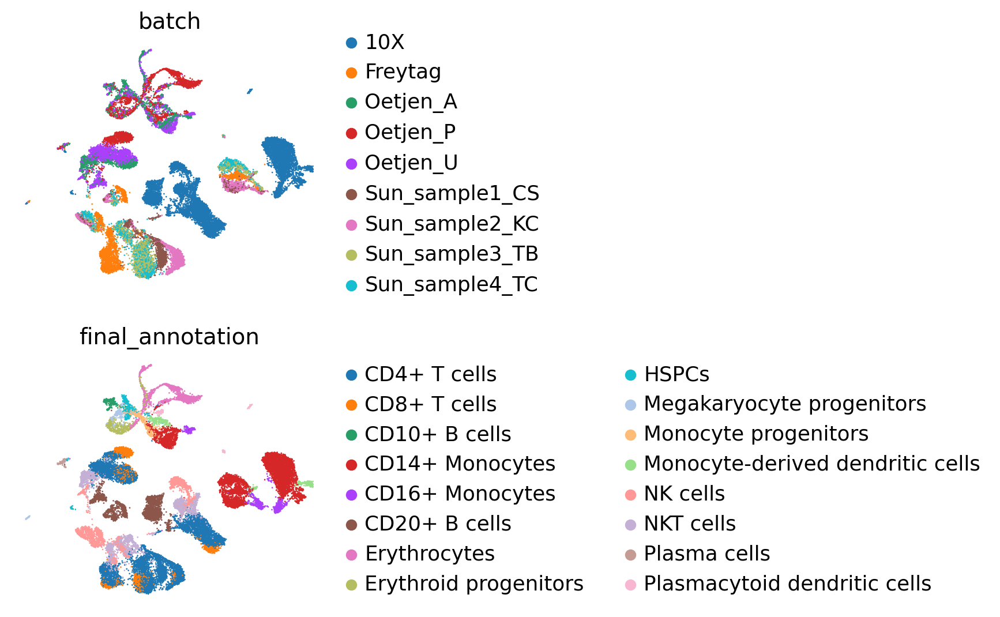

In [13]:
sc.pl.umap(adata, color=["batch", "final_annotation"], ncols=1, frameon=False)

In [14]:
# Save pre-processed data for next notebooks
if overwrite or not (io_dir / "adata_preprocesses.h5ad").exists():
    adata.write_h5ad(io_dir / "adata_preprocesses.h5ad")

## Train DRVI

In [15]:
# You can also skip this cell if model is already trained

# Setup data
DRVI.setup_anndata(
    adata,
    # DRVI accepts count data by default.
    # Do not forget to change gene_likelihood if you provide a non-count data.
    layer="counts",
    batch_key="batch",
    # In addition to batch_key, you can also provide additional `categorical_covariate_keys`.
    # DRVI accepts count data by default.
    # Set to false if you provide log-normalized data and use normal distribution (mse loss).
    is_count_data=True,
)

# Setting seed (set to None if you don't want to fix seed)
scvi.settings.seed = SEED

# construct the model
model = DRVI(
    adata,
    n_latent=128,
    # For encoder and decoder dims, provide a list of integers.
    encoder_dims=[128, 128],
    decoder_dims=[128, 128],
    # depending on the variability of gene dispersions use 'gene' (default) or 'gene-batch'
    # dispersion='gene',
    # dispersion='gene-batch',
)
model

[rank: 0] Seed set to 1


INFO     DRVI: The model has been initialized                                                                      


DRVI 
Latent size: 128, splits: 128, pooling of splits: 'logsumexp', 
Encoder dims: [128, 128], 
Decoder dims: [128, 128], 
Gene likelihood: pnb, 

Training status: Not Trained

In [16]:
# For cpu training you should add the following line to the model.train parameters:
# accelerator="cpu", devices=1,
#
# For mps acceleration on macbooks, add the following line to the model.train parameters:
# accelerator="mps", devices=1,
#
# For gpu training don't provide any additional parameter.
# More details here: https://lightning.ai/docs/pytorch/stable/accelerators/gpu_basic.html

n_epochs = 400
model_path = io_dir / "drvi_model"

# train the model and save (if not already trained)
if overwrite or not model_path.exists():
    model.train(
        max_epochs=n_epochs,
        early_stopping=False,
        early_stopping_patience=20,
        # mps
        # accelerator="mps", devices=1,
        # cpu
        # accelerator="cpu", devices=1,
        # gpu: no additional parameter
        #
        # No need to provide `plan_kwargs` if n_epochs >= 400.
        plan_kwargs={
            "n_epochs_kl_warmup": n_epochs,
        },
    )
    
    # Save the model
    model.save(model_path, overwrite=True)

# Runtime:
# The runtime for CPU laptop (M1) is 208 minutes
# The runtime for Macbook gpu (M1) is 64 minutes
# The runtime for GPU (H100) is 10 minutes

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
You are using a CUDA device ('NVIDIA H100 80GB HBM3') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 400/400: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 400/400 [09:35<00:00,  1.42s/it, v_num=1, train_loss=744]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 400/400 [09:35<00:00,  1.44s/it, v_num=1, train_loss=744]


## Latent space

In [17]:
# Load the model
model = DRVI.load(model_path, adata)
model

INFO     File tmp_io/drvi_immune_128/drvi_model/model.pt already downloaded                                        
INFO     DRVI: The model is trained with DRVI version 0.2.2.                                                       
INFO     DRVI: Updaging data setup config ...                                                                      
INFO     DRVI: Done updating data source registry. Loading in DRVI version 0.2.2.                                  
INFO     DRVI: Loading model from DRVI version 0.2.2.                                                              
INFO     DRVI: Done updating model args. Loading in 0.2.2.                                                         
INFO     DRVI: The model has been initialized                                                                      


DRVI 
Latent size: 128, splits: 128, pooling of splits: 'logsumexp', 
Encoder dims: [128, 128], 
Decoder dims: [128, 128], 
Gene likelihood: pnb, 

Training status: Trained

In [18]:
embed_path = io_dir / "embed.h5ad"

# Create latent space data in anndata format
if overwrite or not embed_path.exists():
    embed = ad.AnnData(model.get_latent_representation(), obs=adata.obs)

    # We set latent dimension stats here (see docs for more info)
    print("Setting latent dimension stats ...")
    model.set_latent_dimension_stats(embed, vanished_threshold=0.5)
    
    # We immediately calculate the interpretability gene scores with different approaches
    print("Calculating gene scores per factor ...")
    # out-of-distribution (OOD) approach uses decoder reconstructions to calculate gene scores (faster)
    model.calculate_interpretability_scores(embed, "OOD")
    # within-distribution (IND) approach iterates over all cells and calculates gene scores
    model.calculate_interpretability_scores(embed, "IND")

    print("Dimension reduction ...")
    sc.pp.neighbors(embed, n_neighbors=10, use_rep="X", n_pcs=embed.X.shape[1])
    sc.tl.umap(embed, spread=1.0, min_dist=0.5, random_state=123)
    sc.pp.pca(embed)

    print("Writing ...")
    embed.write_h5ad(embed_path)

Setting latent dimension stats ...


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 254/254 [00:00<00:00, 269.78it/s]

Calculating gene scores per factor ...
INFO     DRVI: Using all 9 combinations of batch and categorical covariates.                                       



100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 254/254 [00:01<00:00, 159.96it/s]


Dimension reduction ...
Writing ...


In [19]:
embed = sc.read_h5ad(embed_path)

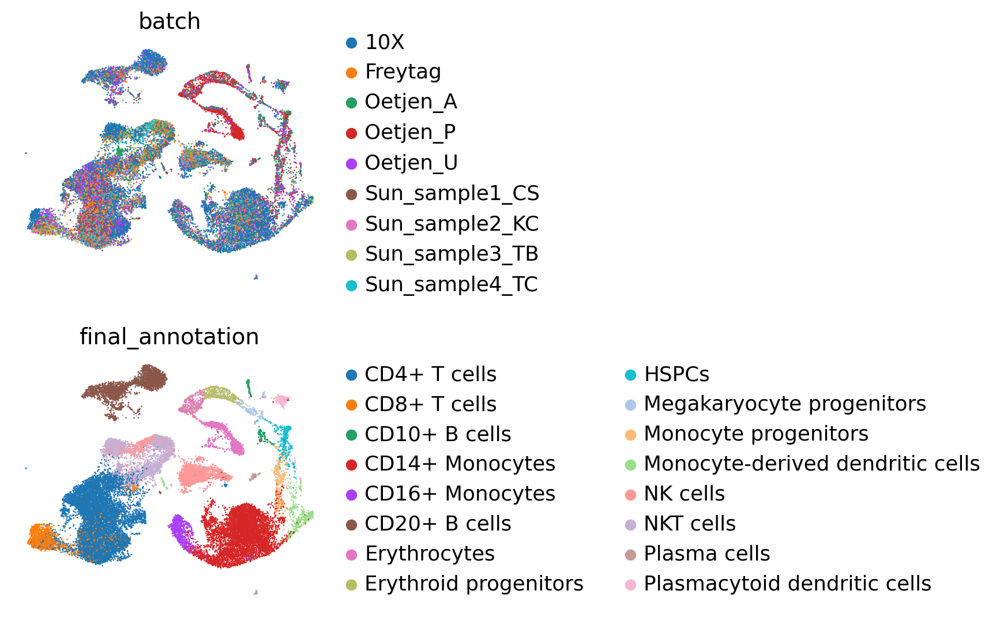

In [20]:
sc.pl.umap(embed, color=["batch", "final_annotation"], ncols=1, frameon=False)

### Check latent dimension stats

In [21]:
# Show information for latent factors
embed.var.sort_values("reconstruction_effect", ascending=False)[:5]

,original_dim_id,reconstruction_effect,order,max_value,mean,min,max,std,std_abs,title,vanished,vanished_positive_direction,vanished_negative_direction
22,22,45004156.0,0,2.504406,-0.165174,-2.504406,1.787719,0.928461,0.472378,DR 1,False,False,False
7,7,8742346.0,1,4.165478,0.023959,-4.165478,1.614366,0.884914,0.589884,DR 2,False,False,False
44,44,7911819.5,2,3.167037,0.018338,-3.167037,1.579996,0.869737,0.549752,DR 3,False,False,False
31,31,7862128.0,3,4.540383,-0.075561,-1.598019,4.540383,0.763927,0.604845,DR 4,False,False,False
71,71,7578233.5,4,4.139865,-0.030023,-1.367767,4.139865,0.747217,0.609722,DR 5,False,False,False


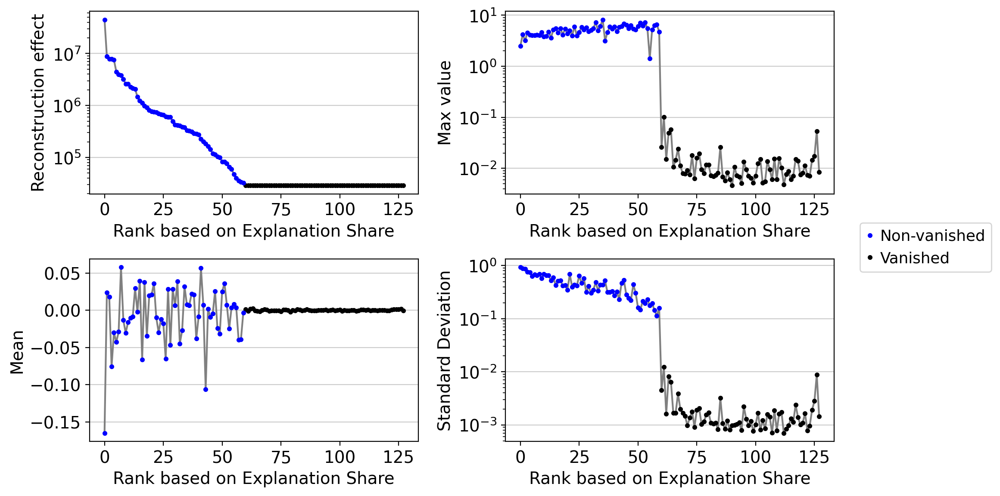

In [22]:
drvi.utils.pl.plot_latent_dimension_stats(embed, ncols=2)

You can check the same plot after removing vanished dimensions

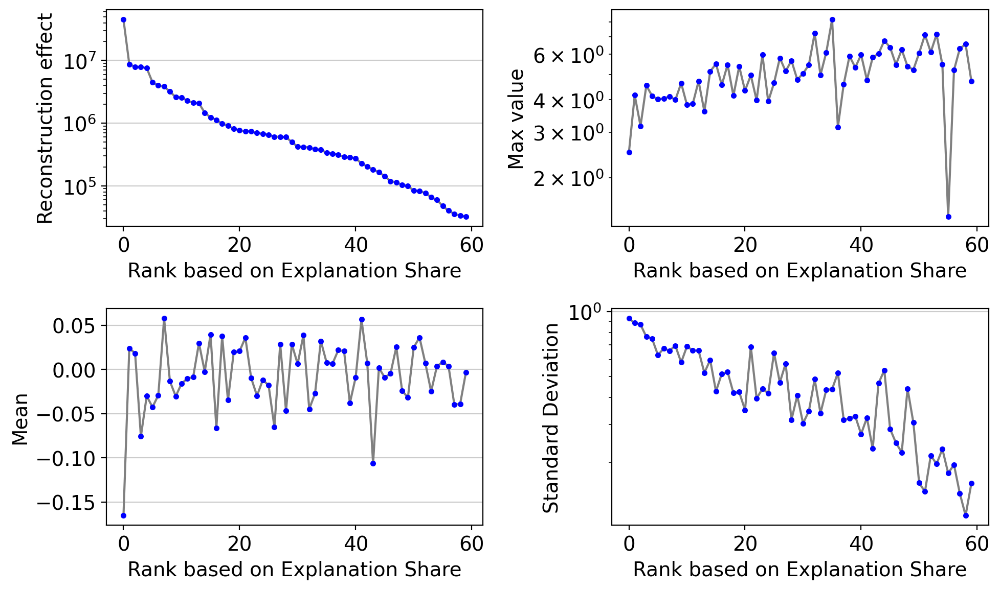

In [23]:
drvi.utils.pl.plot_latent_dimension_stats(embed, ncols=2, remove_vanished=True)

### Plot latent dimensions

By default, vanished dimensions are not plotted. Change arguments if you would like to.

#### UMAP

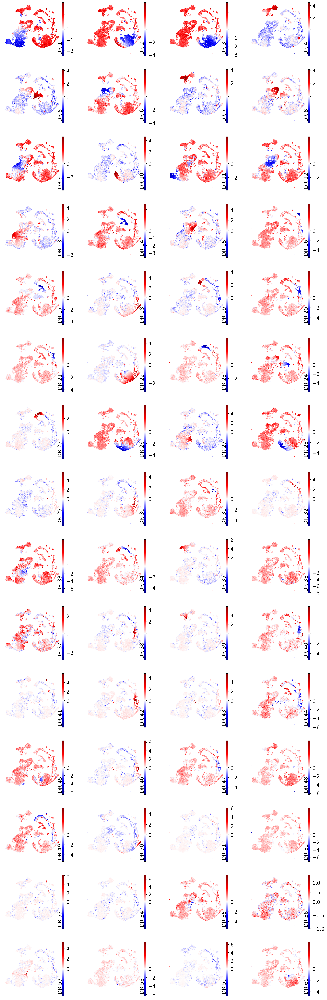

In [24]:
drvi.utils.pl.plot_latent_dims_in_umap(embed)

#### Heatmap

Heatmaps can be useful to visualize general relationship between latent dims and known categories of data

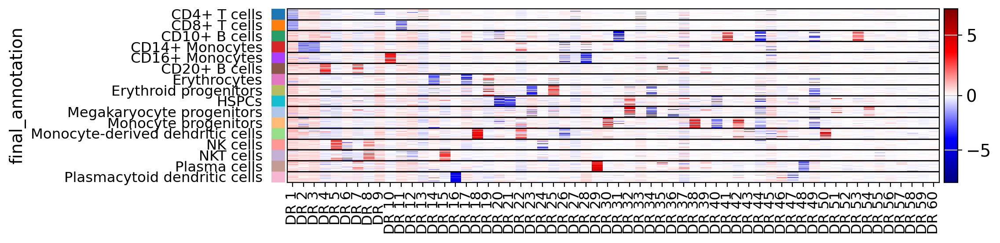

In [25]:
drvi.utils.pl.plot_latent_dims_in_heatmap(embed, "final_annotation", title_col="title")

It is possible to sort dimensions based on the top relevance with respect to a categorical variable

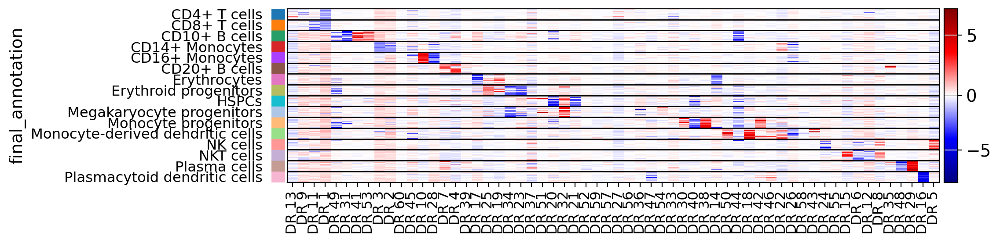

In [26]:
drvi.utils.pl.plot_latent_dims_in_heatmap(embed, "final_annotation", title_col="title", sort_by_categorical=True)

## Interpretability

 The scores are already calculated and stored in embed.varm.

In [27]:
embed.varm

AxisArrays with keys: IND_exp_weighted_mean_negative, IND_exp_weighted_mean_positive, IND_linear_weighted_mean_negative, IND_linear_weighted_mean_positive, IND_max_negative, IND_max_positive, OOD_combined_negative, OOD_combined_positive, OOD_max_possible_negative, OOD_max_possible_positive, OOD_min_possible_negative, OOD_min_possible_positive, PCs

### Out-Of-Distribution (OOD) scores

This approach iterates over latent dimensions and calculates decoder effects.

We first visualize gene scores based on default algorithm (optionally you can pass `key="OOD_combined"`)

These scores show a combination of max effect and specificity. So, this is our suggested method to consider for finding cell-types and most specific genes of a program.

If human readable gene symbols are present in a different column of adata other than adata.var.index, please pass that column as `gene_symbols=...` to the function.

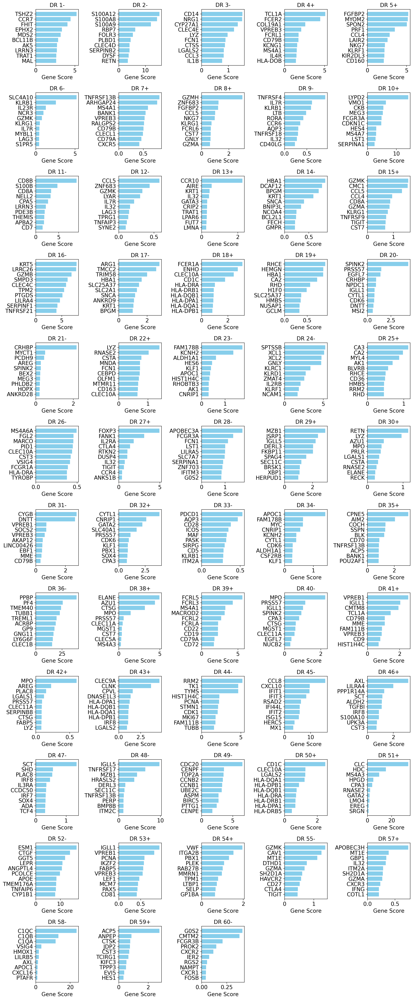

In [28]:
model.plot_interpretability_scores(embed, adata)

You can get all scores as a dataframe:

In [29]:
# Note: Genes (rows of the dataframe) appear as in adata and are not sorted.
scores_df = model.get_interpretability_scores(embed, adata)
scores_df.iloc[:10, :10]

title,DR 1+,DR 1-,DR 2+,DR 2-,DR 3+,DR 3-,DR 4+,DR 4-,DR 5+,DR 5-
index,,,,,,,,,,
TCL1A,1.326346e-11,0.003166,3.001333e-11,0.000882,1.157079e-10,0.000142,5.085912,2.611766e-10,0.000781,1.250808e-10
IGLL5,0.000000e+00,0.000399,0.000000e+00,0.000200,7.073848e-12,0.000076,0.206973,0.000000e+00,0.000005,9.213687e-11
PTGDS,3.211022e-11,0.001098,1.022424e-10,0.000762,1.041750e-09,0.000057,0.000024,2.149253e-07,0.536517,1.011813e-10
GZMB,1.007771e-10,0.009162,1.195000e-09,0.002575,1.440311e-09,0.000635,0.001380,1.261798e-09,1.388031,2.397479e-09
PPBP,3.383320e-10,0.001023,2.251707e-09,0.001824,7.737779e-10,0.000288,0.000120,4.508820e-09,0.000086,2.800739e-09
CD79A,0.000000e+00,0.007296,1.226757e-09,0.001286,5.193467e-10,0.000225,1.386578,1.940003e-10,0.000209,1.906442e-08
FGFBP2,6.965214e-11,0.016959,4.911019e-10,0.002995,6.321999e-10,0.001569,0.004097,5.377135e-10,5.202093,2.243989e-09
FCGR3A,9.137365e-09,0.003884,2.377571e-10,0.005557,1.226049e-10,0.005243,0.000435,5.879858e-09,0.547351,1.396832e-10
GNLY,6.740619e-10,0.029603,2.090752e-09,0.008903,1.907071e-08,0.001928,0.008699,5.933887e-07,2.055596,3.856763e-09


A user can take a deeper look into individual dimensions. By visualizing the min_possible, and max_possible log-fold-changes of each dimension in OOD settings. Please refer to paper appendix for details on these scores that together form OOD_combined.

```
scores_df = model.get_interpretability_scores(embed, adata, key="OOD_max_possible")
scores_df = model.get_interpretability_scores(embed, adata, key="OOD_min_possible")
```

or for visualization:
```
model.plot_interpretability_scores(embed, adata, key="OOD_max_possible")
model.plot_interpretability_scores(embed, adata, key="OOD_max_possible")
```

---
Users can plot top relevant genes of a factor on UMAP using scanpy plotting functions:

DR 11-


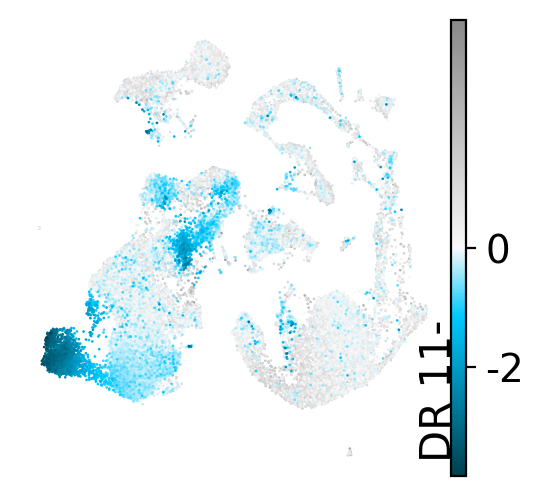

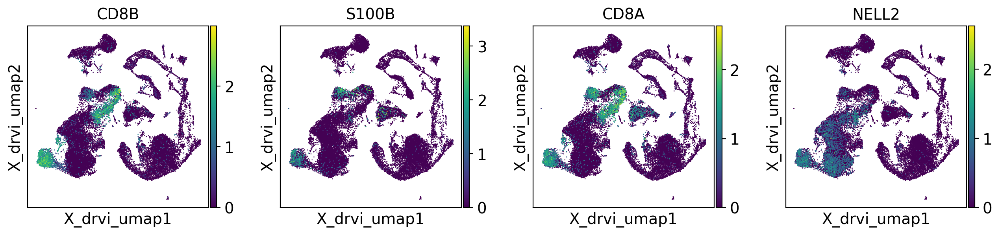

DR 27+


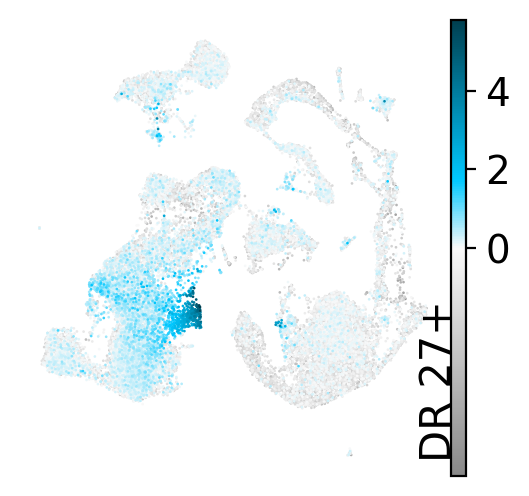

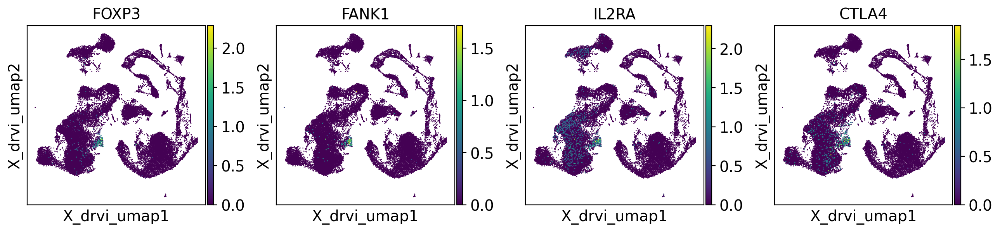

In [30]:
# DR 11- shows CD8+ cells and DR 27+ shows T-reg

# We first copy UMAP embeddings to original anndata
adata.obsm['X_drvi_umap'] = embed[adata.obs.index].obsm['X_umap']

# Show top 4 genes related to these two dimensions
for dim_title in ['DR 11-', 'DR 27+']:
    print(dim_title)
    top_genes = scores_df[dim_title].sort_values(ascending=False).index.to_list()[:4]
    drvi.utils.pl.plot_latent_dims_in_umap(embed, dim_subset=[dim_title], directional=True)
    sc.pl.embedding(adata, "X_drvi_umap", color=top_genes)

### Within-Distribution (IND) scores

This approach iterates over all cells in anndata and averages the effect of each latent factor on each gene. The scores are already stored in embed.

These scores reflect the broad mechanistic effect of each latent dimension. Because genes are not filtered for uniqueness, shared genes retain high scores, providing a complete view of how each factor influences the genetic landscape.

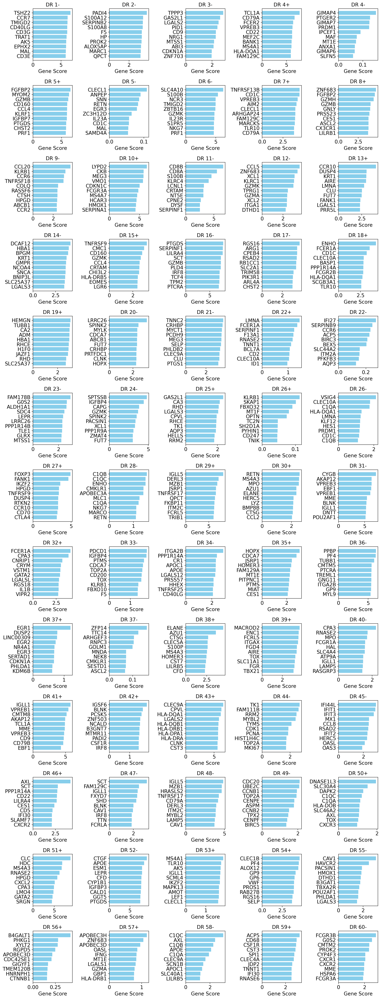

In [31]:
model.plot_interpretability_scores(embed, adata, key="IND_linear_weighted_mean")

You can get all scores as a dataframe:

In [32]:
# Note: Genes (rows of the dataframe) appear as in adata and are not sorted.
scores_df = model.get_interpretability_scores(embed, adata, key="IND_linear_weighted_mean")
scores_df.iloc[:10, :10]

title,DR 1+,DR 1-,DR 2+,DR 2-,DR 3+,DR 3-,DR 4+,DR 4-,DR 5+,DR 5-
index,,,,,,,,,,
TCL1A,0.000149,2.536831,0.001666,0.873762,0.002382,0.849217,7.703324,0.000042,2.097965,0.002969
IGLL5,0.000017,2.506825,0.000274,0.686494,0.000293,0.586317,5.000587,0.000074,1.045412,0.004164
PTGDS,0.000732,2.324526,0.002077,1.075860,0.005422,0.512504,0.537876,0.021270,5.812484,0.000510
GZMB,0.000355,2.541396,0.001816,0.874969,0.001627,0.811381,1.860552,0.001624,6.181503,0.000418
PPBP,0.004211,2.545240,0.000905,1.436478,0.000165,0.844233,1.456442,0.000507,1.272269,0.006260
CD79A,0.000099,3.372381,0.003432,1.269961,0.001312,0.767118,6.659008,0.000032,1.745533,0.009347
FGFBP2,0.000147,2.785291,0.003460,0.626759,0.001119,0.890932,1.835172,0.000911,6.559466,0.000226
FCGR3A,0.005466,2.347882,0.001605,0.880429,0.001124,1.356983,1.440159,0.005142,5.742119,0.000527
GNLY,0.000742,2.445575,0.003193,1.150918,0.005265,0.746231,1.740617,0.009716,5.389999,0.000129


## Identification of programs

Once we identify the top relevant genes, we can determine some programs through supervised external information, such as:
- existing annotations
- examination by biologists
- gene-set enrichment analysis (GSEA)
- scientific literature
- automated tools based on language models

<!-- **Please refer to this tutorial for some tools that we found useful for identification of programs** -->

It is worth mentioning that since such supervised information is not given to the model, the quality of the derived signatures is neither affected nor biased by it. Unidentified processes with high gene scores are promising candidates for further literature search, additional analysis, and even experimental design.